# Sensor, failure and components table

In [1]:
import numpy as np
import pandas as pd

sensor_table_with_failure = np.array([
    ['SensorMes1', 'T2', 'Fan inlet temperature', '◦R', '~', 'Fan', 'Overheating'],
    ['SensorMes2', 'T24', 'LPC outlet temperature', '◦R', 'up', 'LPC', 'Overheating'], 
    ['SensorMes3', 'T30', 'HPC outlet temperature', '◦R', 'up', 'HPC', 'Overheating'],
    ['SensorMes4', 'T50', 'LPT outlet temperature', '◦R', 'up', 'LPT', 'Overheating'],
    ['SensorMes5', 'P2', 'Fan inlet Pressure', 'psia', '~', 'Fan', 'Blockage'],
    ['SensorMes6', 'P15', 'bypass-duct pressure', 'psia', '~', 'Bypass', 'Leakage'],
    ['SensorMes7', 'P30', 'HPC outlet pressure', 'psia', 'down', 'HPC', 'Blockage'],
    ['SensorMes8', 'Nf', 'Physical fan speed', 'rpm', 'up', 'Fan', 'Imbalance'],
    ['SensorMes9', 'Nc', 'Physical core speed', 'rpm', 'up', 'Core', 'Misalignment'],
    ['SensorMes10', 'epr', 'Engine pressure ratio', '-', '~', 'Engine', 'Corrosion'],
    ['SensorMes11', 'Ps30', 'HPC outlet Static pressure', 'psia', 'up', 'HPC', 'Blockage'],
    ['SensorMes12', 'Phi', 'Ratio of fuel flow to Ps30', 'pps/psi', 'down', 'HPC', 'Incomplete_Combustion'],
    ['SensorMes13', 'NRf', 'Corrected fan speed', 'rpm', 'up', 'Fan', 'Imbalance'],
    ['SensorMes14', 'NRc', 'Corrected core speed', 'rpm', 'down', 'Core', 'Misalignment'],
    ['SensorMes15', 'BPR', 'Bypass Ratio','-', 'up', 'Bypass', 'Leakage'],
    ['SensorMes16', 'farB', 'Burner fuel-air ratio', '-', '~', 'Burner', 'Incomplete_Combustion'],
    ['SensorMes17', 'htBleed', 'Bleed Enthalpy', '-', 'up', 'Burner', 'Overheating'],
    ['SensorMes18', 'Nf_dmd', 'Demanded fan speed', 'rpm', '~', 'Fan', 'Misfire'], 
    ['SensorMes19', 'PCNfR_dmd', 'Demanded fan conversion speed', 'rpm)', '~', 'Fan', 'Oil_Leak'],
    ['SensorMes20', 'W31', 'HPT Coolant air flow', 'lbm/s)', 'down', 'HPT', 'Overheating'],
    ['SensorMes21', 'W32', 'LPT Coolant air flow', 'lbm/s)', 'down', 'LPT', 'Corrosion']
])

# Convert to DataFrame
cmapss_description = pd.DataFrame(data=sensor_table_with_failure, columns=["Sensor", "Symbol", "Measurement","Unit", "Trend", "Component", "Failure"])
cmapss_description

,Sensor,Symbol,Measurement,Unit,Trend,Component,Failure
0,SensorMes1,T2,Fan inlet temperature,◦R,~,Fan,Overheating
1,SensorMes2,T24,LPC outlet temperature,◦R,up,LPC,Overheating
2,SensorMes3,T30,HPC outlet temperature,◦R,up,HPC,Overheating
3,SensorMes4,T50,LPT outlet temperature,◦R,up,LPT,Overheating
4,SensorMes5,P2,Fan inlet Pressure,psia,~,Fan,Blockage
5,SensorMes6,P15,bypass-duct pressure,psia,~,Bypass,Leakage
6,SensorMes7,P30,HPC outlet pressure,psia,down,HPC,Blockage
7,SensorMes8,Nf,Physical fan speed,rpm,up,Fan,Imbalance
8,SensorMes9,Nc,Physical core speed,rpm,up,Core,Misalignment
9,SensorMes10,epr,Engine pressure ratio,-,~,Engine,Corrosion


# Ontology graph

In [2]:
# Importing necessary libraries
from rdflib import Graph, Namespace, Literal, RDF, RDFS, OWL, XSD
from rdflib.namespace import NamespaceManager

# Create a new Graph for OWL 2
g_owl2 = Graph()

# Define namespaces for OWL 2 ontology
AERO = Namespace("http://www.aero.org#")
g_owl2.bind('aero', AERO)
g_owl2.bind('rdf', RDF)
g_owl2.bind('rdfs', RDFS)
g_owl2.bind('owl', OWL)

# Return a success message
"Graph for OWL 2 initialized and namespaces defined."


'Graph for OWL 2 initialized and namespaces defined.'

# Entities and sub-entities definition

In [3]:
# Add main entities
for entity in ["Engine", "EngineComponent", "Cycle", "Sensor", "Failure", 
               "OperatingConditionParameter", "WeatherCondition", "FailurePropagation"]:
    g_owl2.add((AERO[entity], RDF.type, OWL.Class))

# Add sub-entities of EngineComponent
for sub_entity in ["Fan", "LPC", "HPC", "LPT", "HPT", "Burner", "Exhaust", "Bypass", "Core"]:
    g_owl2.add((AERO[sub_entity], RDF.type, OWL.Class))
    g_owl2.add((AERO[sub_entity], RDFS.subClassOf, AERO.EngineComponent))

# Add sub-entities of Sensor
for sensor in cmapss_description['Sensor'].unique():
    g_owl2.add((AERO[sensor], RDF.type, OWL.Class))
    g_owl2.add((AERO[sensor], RDFS.subClassOf, AERO.Sensor))

# Add sub-entities of OperatingConditionParameter
for sub_entity in ["Altitude", "MachNumber", "SeaLevelTemperature"]:
    g_owl2.add((AERO[sub_entity], RDF.type, OWL.Class))
    g_owl2.add((AERO[sub_entity], RDFS.subClassOf, AERO.OperatingConditionParameter))

'''# Add sub-entities of Failure
for sub_entity in ["ThermalFailure", "MechanicalFailure", "LubricationFailure", 
                   "CoolingSystemFailure", "FuelSystemFailure"]:
    g_owl2.add((AERO[sub_entity], RDF.type, OWL.Class))
    g_owl2.add((AERO[sub_entity], RDFS.subClassOf, AERO.Failure))'''

# Add sub-entities of Failure
for sub_entity in cmapss_description['Failure'].unique():
    g_owl2.add((AERO[sub_entity], RDF.type, OWL.Class))
    g_owl2.add((AERO[sub_entity], RDFS.subClassOf, AERO.Failure))

# Return a success message
"Entities and sub-entities added to the OWL 2 graph."


'Entities and sub-entities added to the OWL 2 graph.'

In [4]:
cmapss_description['Failure'].unique()

array(['Overheating', 'Blockage', 'Leakage', 'Imbalance', 'Misalignment',
       'Corrosion', 'Incomplete_Combustion', 'Misfire', 'Oil_Leak'],
      dtype=object)

# Relations

In [5]:
'''# Simulate the AERO namespace
for sensor_name in cmapss_description["Sensor"]:
    setattr(AERO, sensor_name, sensor_name)
for failure_name in cmapss_description["Failure"].unique():
    setattr(AERO, failure_name, failure_name)

# Define the canHave relation for simulation
canHave = "canHave"

# Extracting sensor-failure relations from the cmapss_description DataFrame
sensor_failure_relations = []

for index, row in cmapss_description.iterrows():
    sensor_name = row["Sensor"]
    failure_name = row["Failure"]
    relation_tuple = (getattr(AERO, sensor_name), canHave, getattr(AERO, failure_name))
    sensor_failure_relations.append(relation_tuple)
'''



# AERO namespace
AERO = Namespace('http://www.aero.org#')

# Extracting sensor-failure relations from the cmapss_description DataFrame
sensor_failure_relations = []

for index, row in cmapss_description.iterrows():
    sensor_name = row["Sensor"]
    failure_name = row["Failure"]
    relation_tuple = (
        AERO[sensor_name],
        AERO.canHave,
        AERO[failure_name]
    )
    sensor_failure_relations.append(relation_tuple)


In [6]:
sensor_failure_relations

[(rdflib.term.URIRef('http://www.aero.org#SensorMes1'),
  rdflib.term.URIRef('http://www.aero.org#canHave'),
  rdflib.term.URIRef('http://www.aero.org#Overheating')),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes2'),
  rdflib.term.URIRef('http://www.aero.org#canHave'),
  rdflib.term.URIRef('http://www.aero.org#Overheating')),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes3'),
  rdflib.term.URIRef('http://www.aero.org#canHave'),
  rdflib.term.URIRef('http://www.aero.org#Overheating')),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes4'),
  rdflib.term.URIRef('http://www.aero.org#canHave'),
  rdflib.term.URIRef('http://www.aero.org#Overheating')),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes5'),
  rdflib.term.URIRef('http://www.aero.org#canHave'),
  rdflib.term.URIRef('http://www.aero.org#Blockage')),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes6'),
  rdflib.term.URIRef('http://www.aero.org#canHave'),
  rdflib.term.URIRef('http://www.aero.org#Leakage')),
 (rdf

In [7]:
# Define properties for relations
hasMultiple = AERO.hasMultiple
monitoredBy = AERO.monitoredBy
canHave = AERO.canHave
isCloseTo = AERO.isCloseTo
flowGoesFrom = AERO.flowGoesFrom

# Create ObjectProperties for relations
relations_properties = [hasMultiple, monitoredBy, canHave, isCloseTo, flowGoesFrom]
for rel_prop in relations_properties:
    g_owl2.add((rel_prop, RDF.type, OWL.ObjectProperty))

# Add relations
relations_data = [
    (AERO.Engine, hasMultiple, AERO.EngineComponent),
    (AERO.Engine, hasMultiple, AERO.Cycle),
    (AERO.Engine, canHave, AERO.Failure),
    (AERO.Engine, monitoredBy, AERO.SensorMes10),
    (AERO.Cycle, hasMultiple, AERO.OperatingConditionParameter),
    (AERO.Fan, monitoredBy, AERO.SensorMes1),
    (AERO.Fan, monitoredBy, AERO.SensorMes5),
    (AERO.Fan, monitoredBy, AERO.SensorMes8),
    (AERO.Fan, monitoredBy, AERO.SensorMes13),
    (AERO.Fan, monitoredBy, AERO.SensorMes18),
    (AERO.Fan, monitoredBy, AERO.SensorMes19),
    (AERO.LPC, monitoredBy, AERO.SensorMes2),
    (AERO.HPC, monitoredBy, AERO.SensorMes3),
    (AERO.HPC, monitoredBy, AERO.SensorMes7),
    (AERO.HPC, monitoredBy, AERO.SensorMes11),
    (AERO.HPC, monitoredBy, AERO.SensorMes12),
    (AERO.LPT, monitoredBy, AERO.SensorMes4),
    (AERO.LPT, monitoredBy, AERO.SensorMes21),
    (AERO.HPT, monitoredBy, AERO.SensorMes20),
    (AERO.Burner, monitoredBy, AERO.SensorMes16),
    (AERO.Burner, monitoredBy, AERO.SensorMes17),
    (AERO.Bypass, monitoredBy, AERO.SensorMes6),
    (AERO.Bypass, monitoredBy, AERO.SensorMes15),
    (AERO.Core, monitoredBy, AERO.SensorMes9),
    (AERO.Core, monitoredBy, AERO.SensorMes14),
    (AERO.Fan, isCloseTo, AERO.LPC),
    (AERO.LPC, isCloseTo, AERO.HPC),
    (AERO.HPC, isCloseTo, AERO.Burner),
    (AERO.Burner, isCloseTo, AERO.HPT),
    (AERO.HPT, isCloseTo, AERO.LPT),
    (AERO.LPT, isCloseTo, AERO.Exhaust),
    (AERO.Fan, flowGoesFrom, AERO.LPC),
    (AERO.LPC, flowGoesFrom, AERO.HPC),
    (AERO.HPC, flowGoesFrom, AERO.Burner),
    (AERO.Burner, flowGoesFrom, AERO.HPT),
    (AERO.HPT, flowGoesFrom, AERO.LPT),
    (AERO.LPT, flowGoesFrom, AERO.Exhaust)
]

# Add the relations to the graph
for (s, p, o) in relations_data:
    g_owl2.add((s, p, o))
    
    
# Append the new relations beetwin sensor and failure to the relations_data list
relations_data.extend(sensor_failure_relations)

relations_data

[(rdflib.term.URIRef('http://www.aero.org#Engine'),
  rdflib.term.URIRef('http://www.aero.org#hasMultiple'),
  rdflib.term.URIRef('http://www.aero.org#EngineComponent')),
 (rdflib.term.URIRef('http://www.aero.org#Engine'),
  rdflib.term.URIRef('http://www.aero.org#hasMultiple'),
  rdflib.term.URIRef('http://www.aero.org#Cycle')),
 (rdflib.term.URIRef('http://www.aero.org#Engine'),
  rdflib.term.URIRef('http://www.aero.org#canHave'),
  rdflib.term.URIRef('http://www.aero.org#Failure')),
 (rdflib.term.URIRef('http://www.aero.org#Engine'),
  rdflib.term.URIRef('http://www.aero.org#monitoredBy'),
  rdflib.term.URIRef('http://www.aero.org#SensorMes10')),
 (rdflib.term.URIRef('http://www.aero.org#Cycle'),
  rdflib.term.URIRef('http://www.aero.org#hasMultiple'),
  rdflib.term.URIRef('http://www.aero.org#OperatingConditionParameter')),
 (rdflib.term.URIRef('http://www.aero.org#Fan'),
  rdflib.term.URIRef('http://www.aero.org#monitoredBy'),
  rdflib.term.URIRef('http://www.aero.org#SensorMes1')

In [8]:
# Define attributes for each entity
attributes = {
    AERO.Engine: [
        (AERO.UnitNumber, XSD.int)
    ],
    AERO.EngineComponent: [
        (AERO.ComponentType, XSD.string),
        (AERO.ComponentStatus, XSD.string)
    ],
    AERO.Cycle: [
        (AERO.CycleNumber, XSD.int)
    ],
    AERO.Sensor: [
        (AERO.SensorType, XSD.string),
        (AERO.MeasurementValue, XSD.float),
        (AERO.MeasurementTime, XSD.dateTime),
        (AERO.MeasurementUnit, XSD.string)
    ],
    AERO.OperationalParameter: [
        (AERO.ParameterType, XSD.string),
        (AERO.ParameterValue, XSD.float)
    ],
    AERO.Failure: [
        (AERO.FailureType, XSD.string),
        (AERO.MomentOfFailure, XSD.dateTime)
    ],
    AERO.OperatingCondition: [
        (AERO.ConditionType, XSD.string)
    ],
    AERO.WeatherCondition: [
        (AERO.ConditionType, XSD.string),
        (AERO.Value, XSD.float)
    ],
    AERO.FailurePropagation: [
        (AERO.SourceComponent, XSD.string),
        (AERO.TargetComponent, XSD.string),
        (AERO.PropagationProbability, XSD.float)
    ]
}

# Add the attributes to the graph
for entity, attrs in attributes.items():
    for attr, datatype in attrs:
        g_owl2.add((attr, RDF.type, OWL.DatatypeProperty))
        g_owl2.add((attr, RDFS.domain, entity))
        g_owl2.add((attr, RDFS.range, datatype))

# Return a success message
"Attributes added to the OWL 2 graph."


'Attributes added to the OWL 2 graph.'

In [9]:
# 1. Which engine components can have a Thermal Failure?
query1 = """
PREFIX aero: <http://www.aero.org#>
SELECT ?component
WHERE {
    ?component aero:canHave aero:ThermalFailure .
}
"""


# Execute the queries on OWL 2 graph
results1_owl2 = list(g_owl2.query(query1))

results1_owl2

[]

In [10]:

# 2. Which sensors monitor the HPC?
query2 = """
PREFIX aero: <http://www.aero.org#>
SELECT ?sensor
WHERE {
    aero:HPC aero:monitoredBy ?sensor .
}
"""

# Execute the queries on OWL 2 graph
results2_owl2 = list(g_owl2.query(query2))

results2_owl2

[(rdflib.term.URIRef('http://www.aero.org#SensorMes3'),),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes7'),),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes11'),),
 (rdflib.term.URIRef('http://www.aero.org#SensorMes12'),)]

In [11]:
# 3. Which engine components are close to the Burner?
query3 = """
PREFIX aero: <http://www.aero.org#>
SELECT ?component
WHERE {
    ?component aero:isCloseTo aero:Burner .
}
"""

# Execute the queries on OWL 2 graph
results3_owl2 = list(g_owl2.query(query3))

results3_owl2

[(rdflib.term.URIRef('http://www.aero.org#HPC'),)]

In [13]:
from pyvis.network import Network
import networkx as nx

# Convert rdflib Graph to NetworkX graph with filtering out rdf:type
def convert_to_networkx_filtered(graph):
    G = nx.DiGraph()
    
    for subj, pred, obj in graph:
        # Filter out rdf:type triples
        if pred != RDF.type:
            # Use only the local part of URIs as labels
            s_label = str(subj).split("#")[-1] if "#" in str(subj) else str(subj).split("/")[-1]
            o_label = str(obj).split("#")[-1] if "#" in str(obj) else str(obj).split("/")[-1]
            p_label = str(pred).split("#")[-1] if "#" in str(pred) else str(pred).split("/")[-1]
            
            # Add nodes and edges with local labels
            if not (s_label, o_label) in G.edges():
                G.add_edge(s_label, o_label, title=p_label)
            else:
                existing_data = G[s_label][o_label]
                if existing_data["title"] != p_label:
                    new_title = existing_data["title"] + "\n" + p_label
                    G[s_label][o_label]["title"] = new_title
                
    return G

# Add sensor-failure relations to the RDF graph
for row in sensor_table_with_failure:
    sensor_name = row[0]
    failure_name = row[-1]
    g_owl2.add((AERO[sensor_name], AERO.canHave, AERO[failure_name]))


# Create a pyvis Network from a NetworkX graph
def draw_networkx_nx(graph, notebook=True):
    '''nt = Network(notebook=notebook, directed=True)
    # Populate the network with the NetworkX graph
    nt.from_nx(graph)
    # Set options
    nt.set_options("""
    var options = {
      "nodes": {
        "font": {
          "size": 12
        }
      },
      "edges": {
        "smooth": true
      },
      "physics": {
        "minVelocity": 0.75,
        "solver": "forceAtlas2Based"
      }
    }
    """)'''
    
    nt = Network(notebook=notebook, directed=True)
    nt.from_nx(graph)
    
    # Adjust node size and font size
    nt.set_options("""
    var options = {
      "nodes": {
        "font": {
          "size": 30
        },
        "scaling": {
            "label": {
                "enabled": true,
                "min": 18,
                "max": 18
            }
        },
        "size": 30
      },
      "edges": {
        "smooth": true
      },
      "physics": {
        "minVelocity": 2.0,
        "solver": "forceAtlas2Based"
      }
    }
    """)
    return nt

# Convert the RDFlib graph to NetworkX format
'''G_nx = convert_to_networkx(g_owl2)'''
G_nx = convert_to_networkx_filtered(g_owl2)

# Draw the network
nt = draw_networkx_nx(G_nx)
nt.show("ont_graph.html")


ont_graph.html


In [14]:
# saving the g_owl2 ontology
g_owl2.serialize(destination="./cmapss_ontology.owl", format="xml")

<Graph identifier=Na765c5d7f6364a1099787f88a28d556c (<class 'rdflib.graph.Graph'>)>

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

#columns names
unitNames = ['UnitNumber']
timeCycles = ["TimeInCycles"]
operSets = ["OperSet"+str(i) for i in range(1,4)] # 1,2 et 3
sensorMes = ["SensorMes"+str(j) for j in range(1, 22)] # de 1 à 21
columnsNames = unitNames + timeCycles + operSets +sensorMes

# Load the data
df = pd.read_csv('./data/train_FD001.txt', delim_whitespace=True, names=columnsNames)

# Forcer l'affichage de toutes les colonnes
pd.set_option('display.max_columns', None)

df

,UnitNumber,TimeInCycles,OperSet1,OperSet2,OperSet3,SensorMes1,SensorMes2,SensorMes3,SensorMes4,SensorMes5,SensorMes6,SensorMes7,SensorMes8,SensorMes9,SensorMes10,SensorMes11,SensorMes12,SensorMes13,SensorMes14,SensorMes15,SensorMes16,SensorMes17,SensorMes18,SensorMes19,SensorMes20,SensorMes21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,48.07,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,48.04,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,48.09,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,48.39,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


In [3]:
df.describe()

,UnitNumber,TimeInCycles,OperSet1,OperSet2,OperSet3,SensorMes1,SensorMes2,SensorMes3,SensorMes4,SensorMes5,SensorMes6,SensorMes7,SensorMes8,SensorMes9,SensorMes10,SensorMes11,SensorMes12,SensorMes13,SensorMes14,SensorMes15,SensorMes16,SensorMes17,SensorMes18,SensorMes19,SensorMes20,SensorMes21
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,21.609803,553.367711,2388.096652,9065.242941,1.300000e+00,47.541168,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,0.001389,0.885092,0.070985,22.082880,4.660829e-13,0.267087,0.737553,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,21.600000,549.850000,2387.900000,9021.730000,1.300000e+00,46.850000,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,21.610000,552.810000,2388.050000,9053.100000,1.300000e+00,47.350000,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,21.610000,553.440000,2388.090000,9060.660000,1.300000e+00,47.510000,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,21.610000,554.010000,2388.140000,9069.420000,1.300000e+00,47.700000,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,21.610000,556.060000,2388.560000,9244.590000,1.300000e+00,48.530000,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


In [35]:
'''sensor_mesurements = data.drop(columns = ["UnitNumber", "TimeInCycles", "OperSet1", "OperSet2", "OperSet3"])
sensor_mesurements'''

'sensor_mesurements = data.drop(columns = ["UnitNumber", "TimeInCycles", "OperSet1", "OperSet2", "OperSet3"])\nsensor_mesurements'

In [36]:
sensor_mesurements = df.iloc[:,5:]
sensor_mesurements

,SensorMes1,SensorMes2,SensorMes3,SensorMes4,SensorMes5,SensorMes6,SensorMes7,SensorMes8,SensorMes9,SensorMes10,SensorMes11,SensorMes12,SensorMes13,SensorMes14,SensorMes15,SensorMes16,SensorMes17,SensorMes18,SensorMes19,SensorMes20,SensorMes21
0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,48.07,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,48.04,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,48.09,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,48.39,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


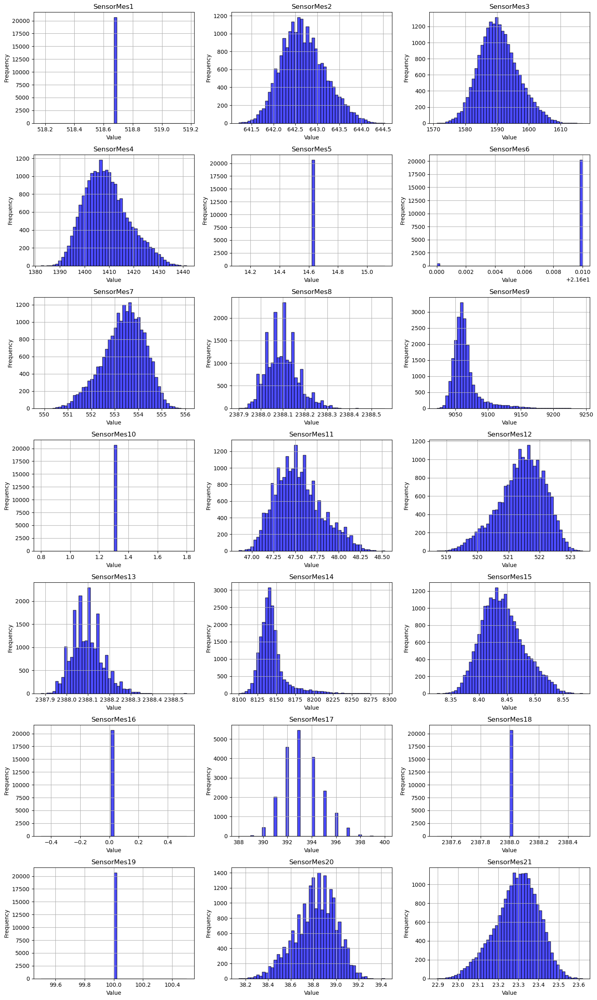

In [37]:
# Plotting histograms for each available sensor
plt.figure(figsize=(15, 25))

# Loop through each available sensor measurement
for i, sensor in enumerate(sensor_mesurements.columns, 1):
    plt.subplot(7, 3, i)
    sensor_mesurements[sensor].hist(alpha=0.7, bins=50, color="blue", edgecolor="black")
    plt.title(sensor)
    plt.ylabel("Frequency")
    plt.xlabel("Value")

# Adjust layout
plt.tight_layout()
plt.show()

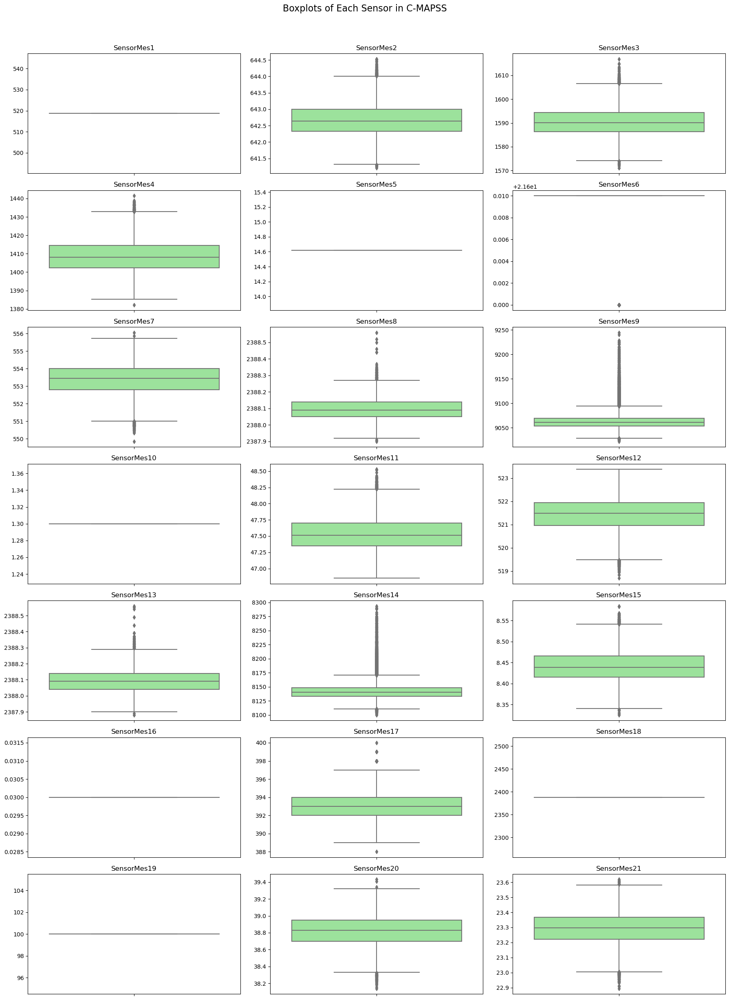

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting boxplots for each sensor in C-MAPSS
fig, axes = plt.subplots(nrows=7, ncols=3, figsize=(18, 24))
fig.suptitle('Boxplots of Each Sensor in C-MAPSS', fontsize=16, y=1.02)

# Plot boxplot for each sensor
for i, column in enumerate(sensorMes):
    sns.boxplot(y=df[column], ax=axes[i//3, i%3], color='lightgreen')
    axes[i//3, i%3].set_title(column)
    axes[i//3, i%3].set_xlabel('')
    axes[i//3, i%3].set_ylabel('')

# Adjust layout
plt.tight_layout()
plt.show()


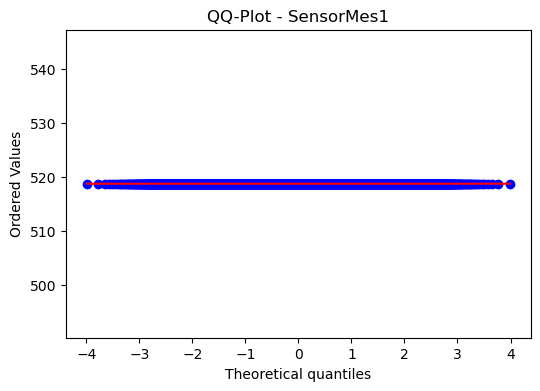

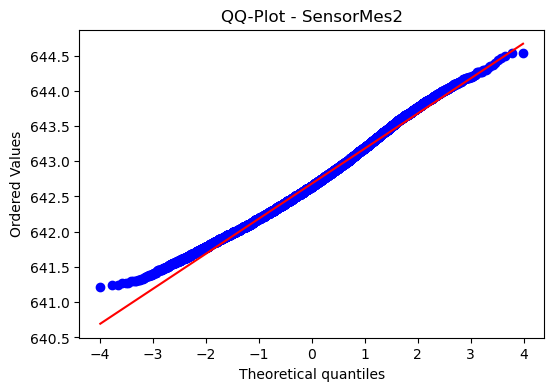

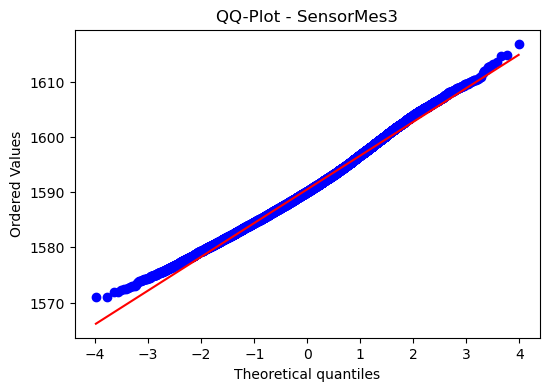

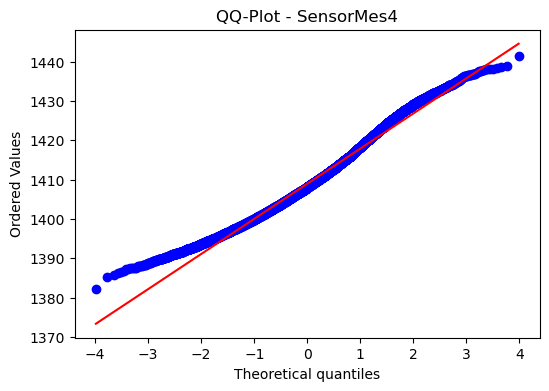

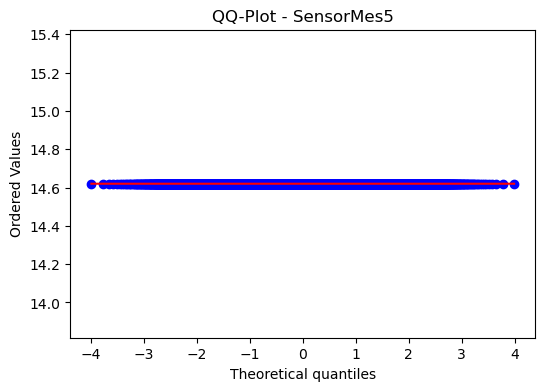

...

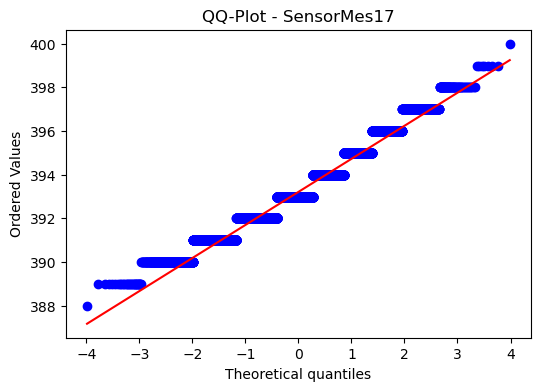

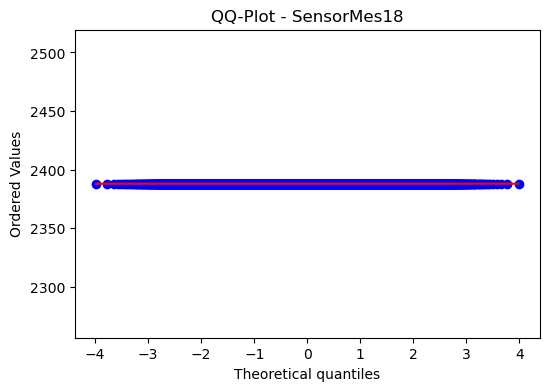

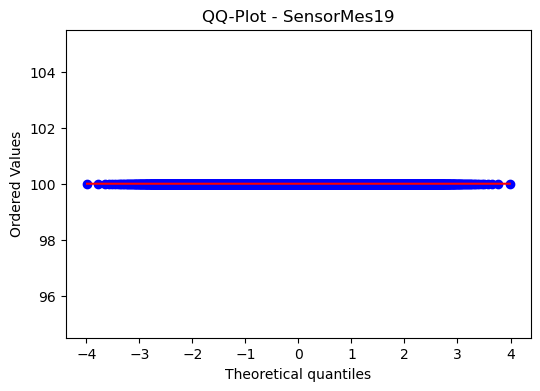

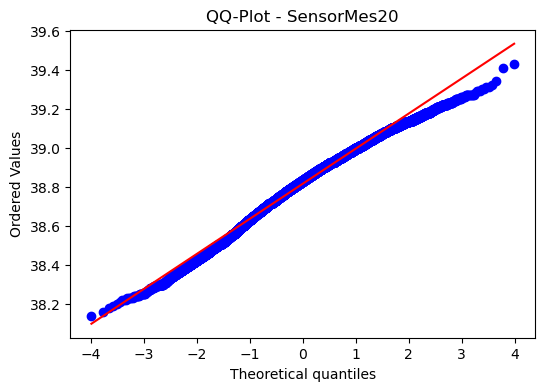

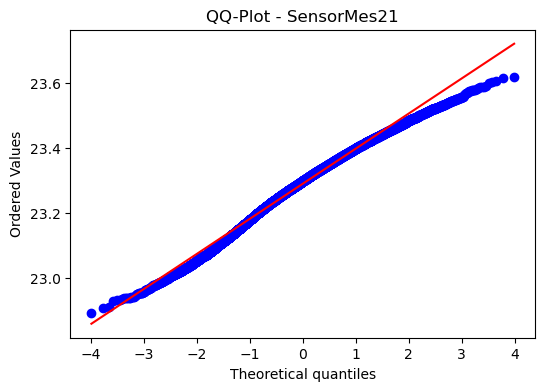

In [7]:
import scipy.stats as stats

# Function to plot QQ-plots for each sensor
def plot_qq(sensor_name, data):
    fig, ax = plt.subplots(figsize=(6, 4))
    stats.probplot(data[sensor_name], dist="norm", plot=ax)
    ax.set_title(f'QQ-Plot - {sensor_name}')
    plt.show()

# Displaying the QQ-plots for first few sensors as an example
for sensor in sensorMes[:21]:
    plot_qq(sensor, df)


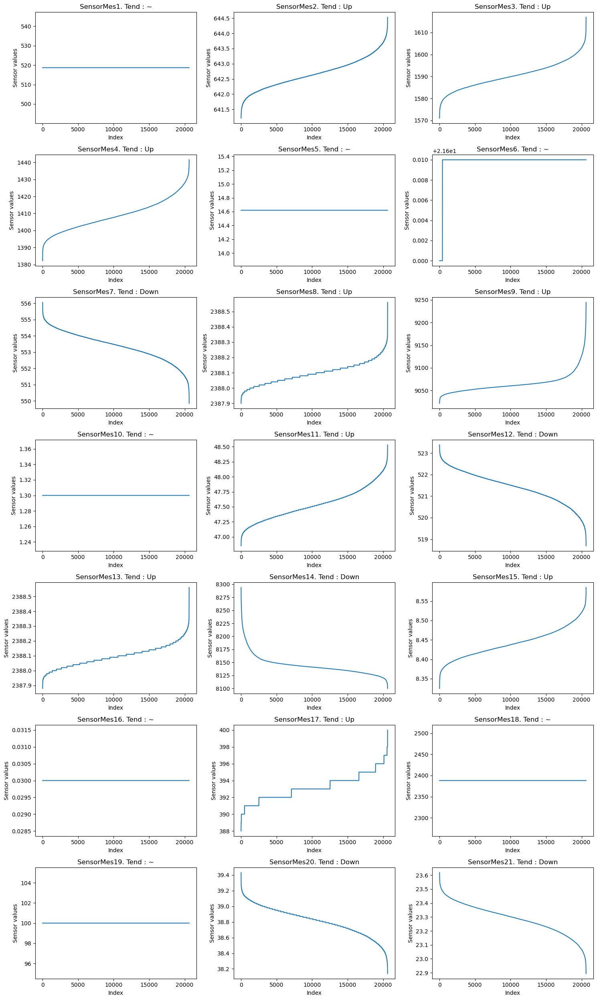

In [38]:
# Plotting histograms for each available sensor
plt.figure(figsize=(15, 25))

# Loop through each available sensor measurement
for i, sensor in enumerate(sensor_mesurements.columns, 1):
    plt.subplot(7, 3, i)
    
    #reverse when trend == down
    trend = cmapss_description[cmapss_description['Sensor']==sensor]['Trend'].values
    
    #sort the sensor values regarding the trend of each sensor
    if trend == 'down':
        plt.plot(sorted(sensor_mesurements[sensor].values, reverse=True))
        senor_val_trend = '. Tend : Down'
    elif trend == 'up':
        plt.plot(sorted(sensor_mesurements[sensor].values))
        senor_val_trend = '. Tend : Up'
    elif trend == '~':
        plt.plot(sorted(sensor_mesurements[sensor].values))
        senor_val_trend = '. Tend : ~' 
    
    sensor_detail = sensor + senor_val_trend
    
    plt.title(sensor_detail)
    plt.ylabel("Sensor values")
    plt.xlabel("Index")

# Adjust layout
plt.tight_layout()
plt.show()

In [39]:
#data labeling : compute the RUL
rul = pd.DataFrame(df.groupby('UnitNumber')['TimeInCycles'].max()).reset_index()
rul.columns = ['UnitNumber', 'max']
data_with_rul = df.merge(rul, on=['UnitNumber'], how='left')
data_with_rul['RUL'] = data_with_rul['max'] - data_with_rul['TimeInCycles']
data_with_rul.drop('max', axis=1, inplace=True)
data_with_rul

,UnitNumber,TimeInCycles,OperSet1,OperSet2,OperSet3,SensorMes1,SensorMes2,SensorMes3,SensorMes4,SensorMes5,SensorMes6,SensorMes7,SensorMes8,SensorMes9,SensorMes10,SensorMes11,SensorMes12,SensorMes13,SensorMes14,SensorMes15,SensorMes16,SensorMes17,SensorMes18,SensorMes19,SensorMes20,SensorMes21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,48.07,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,48.04,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,48.09,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,48.39,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,1


In [29]:
'''def compute_critical_threshold(data, sensor, fraction=0.05):
    """
    Compute the average of the last fraction of readings as the critical threshold.
    """
    last_cycles = int(len(data) * fraction)
    return data[sensor][-last_cycles:].mean()

# Visualize sensor measurements with critical threshold for the first 10 units
for unit in data_with_rul[unitNames[0]].unique()[:10]:  # Starting with first 10 units
    data_unit = data_with_rul[data_with_rul[unitNames[0]] == unit]
    
    # Create a new figure for the unit
    fig, axes = plt.subplots(nrows=int(np.ceil(len(sensorMes) / 5)), ncols=5, figsize=(20, 20))
    fig.suptitle(f"Sensor Measurements with Critical Threshold for {unitNames[0]} {unit}", fontsize=20)
    
    # Flatten axes for easy iteration
    axes_flat = axes.flatten()
    
    # Plot sensor measurements and critical threshold
    for i, sensor in enumerate(sensorMes):
        ax = axes_flat[i]
        threshold = compute_critical_threshold(data_unit, sensor)
        
        ax.plot(data_unit[timeCycles[0]], data_unit[sensor], marker='.', markerfacecolor='none', alpha=0.7)
        ax.axhline(y=threshold, color='r', linestyle='--', label='Critical Threshold')
        
        ax.set_title(sensor)
        ax.set_xlabel(timeCycles[0])
        ax.set_ylabel('Measurement Value')
        ax.legend()
        
    # Remove any unused subplots
    for i in range(len(sensorMes), len(axes_flat)):
        fig.delaxes(axes_flat[i])
    
    # Adjust layout and display the plot
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()
'''

'def compute_critical_threshold(data, sensor, fraction=0.05):\n    """\n    Compute the average of the last fraction of readings as the critical threshold.\n    """\n    last_cycles = int(len(data) * fraction)\n    return data[sensor][-last_cycles:].mean()\n\n# Visualize sensor measurements with critical threshold for the first 10 units\nfor unit in data_with_rul[unitNames[0]].unique()[:10]:  # Starting with first 10 units\n    data_unit = data_with_rul[data_with_rul[unitNames[0]] == unit]\n    \n    # Create a new figure for the unit\n    fig, axes = plt.subplots(nrows=int(np.ceil(len(sensorMes) / 5)), ncols=5, figsize=(20, 20))\n    fig.suptitle(f"Sensor Measurements with Critical Threshold for {unitNames[0]} {unit}", fontsize=20)\n    \n    # Flatten axes for easy iteration\n    axes_flat = axes.flatten()\n    \n    # Plot sensor measurements and critical threshold\n    for i, sensor in enumerate(sensorMes):\n        ax = axes_flat[i]\n        threshold = compute_critical_threshold(

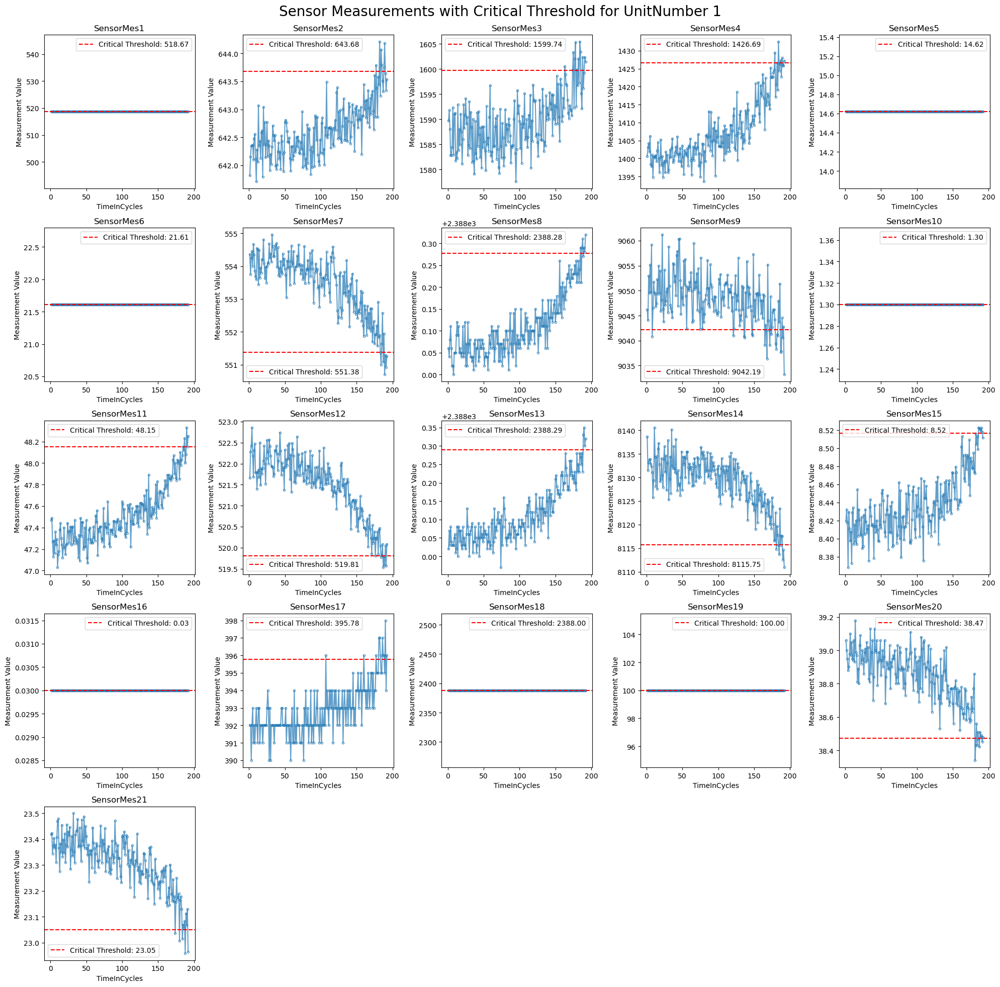

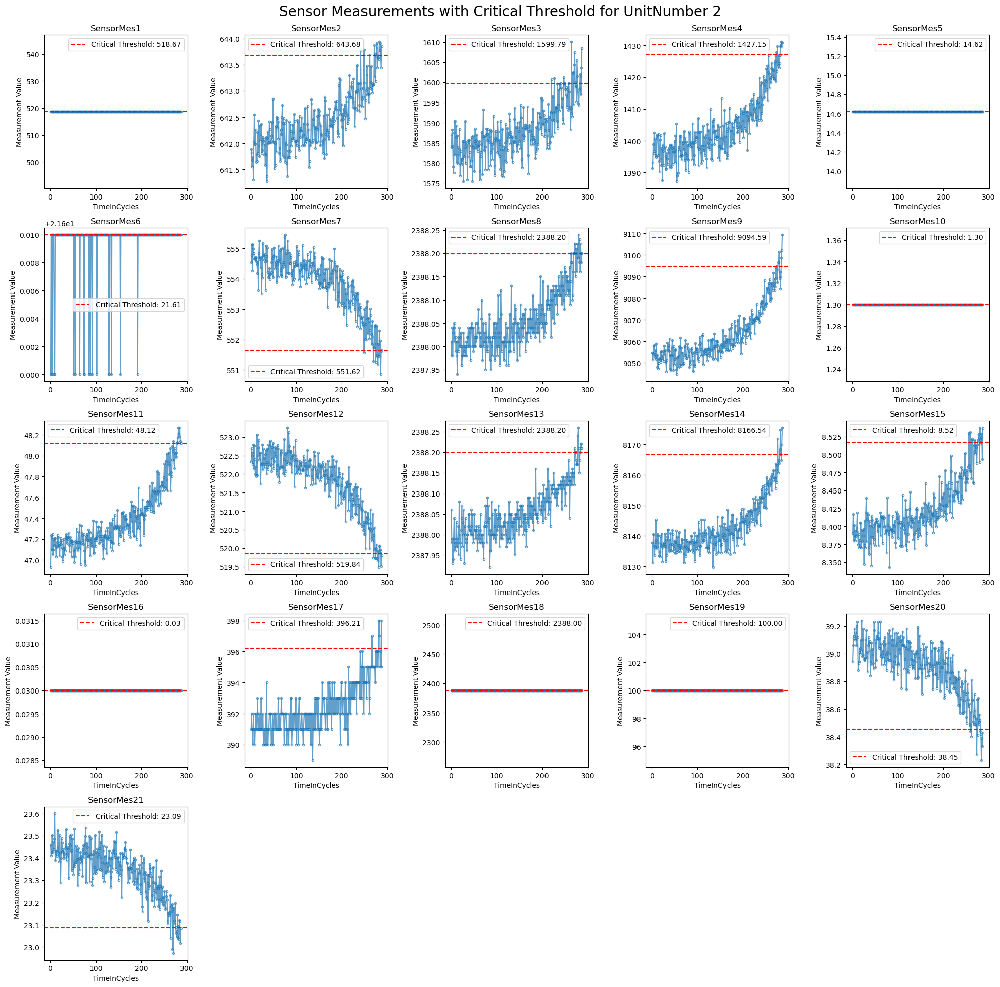

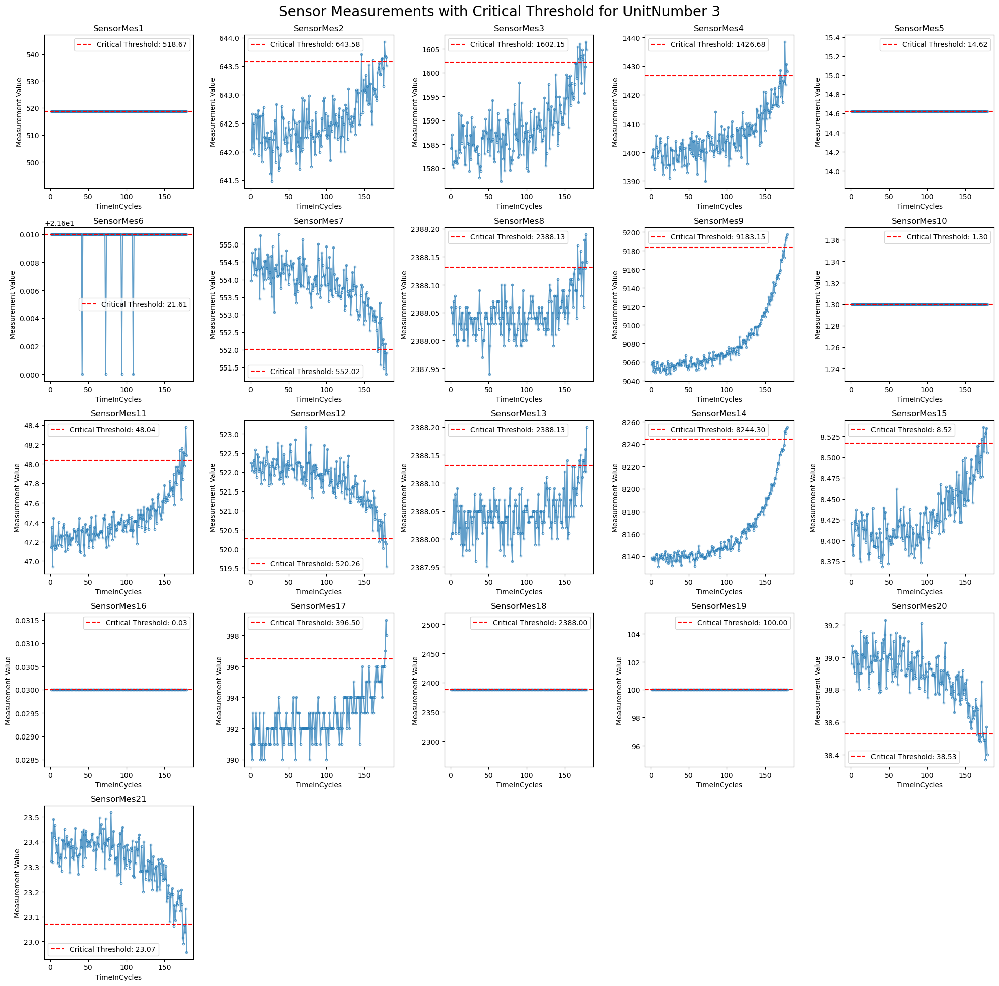

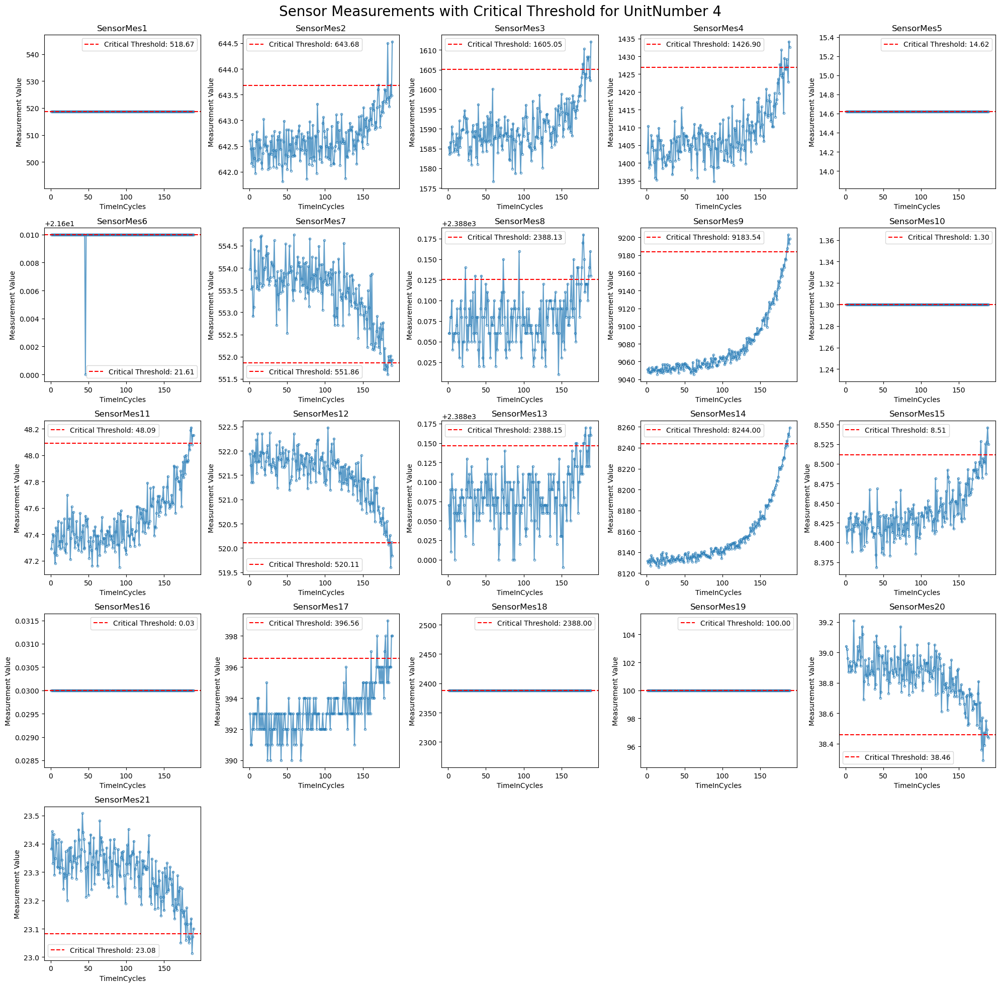

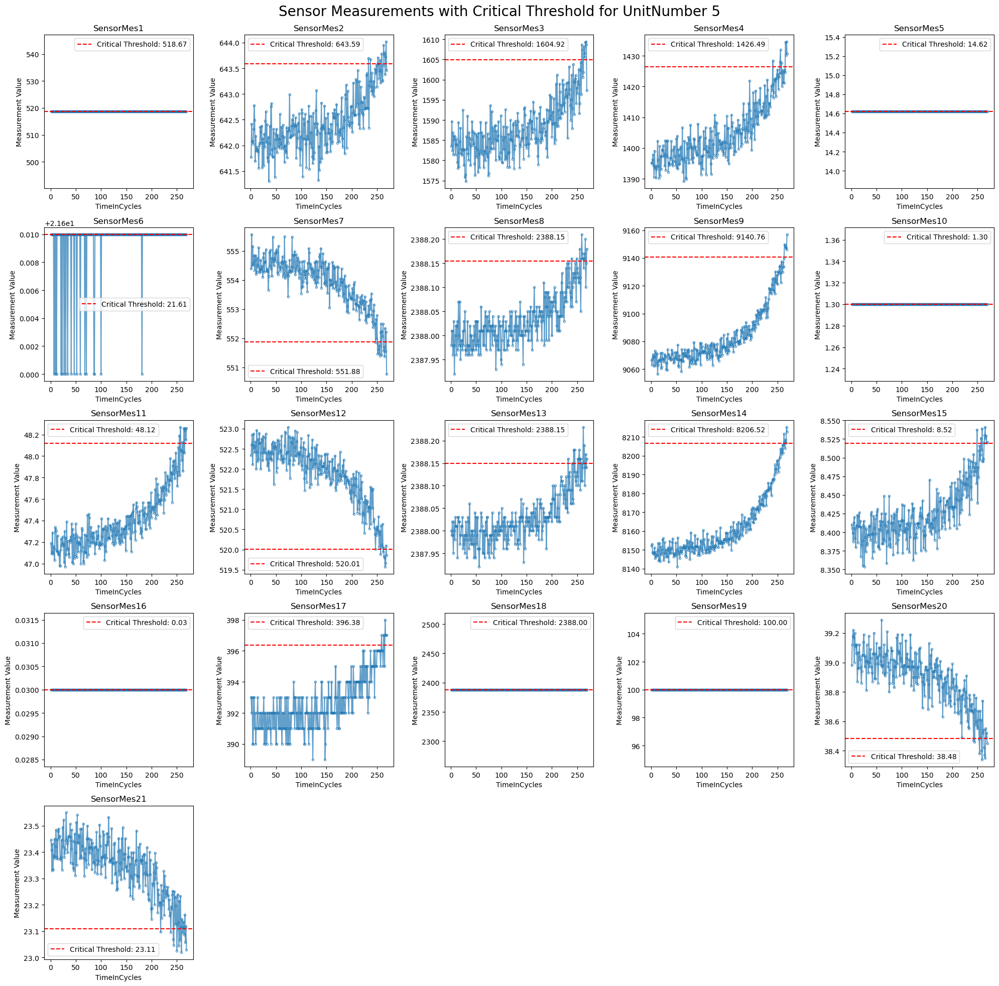

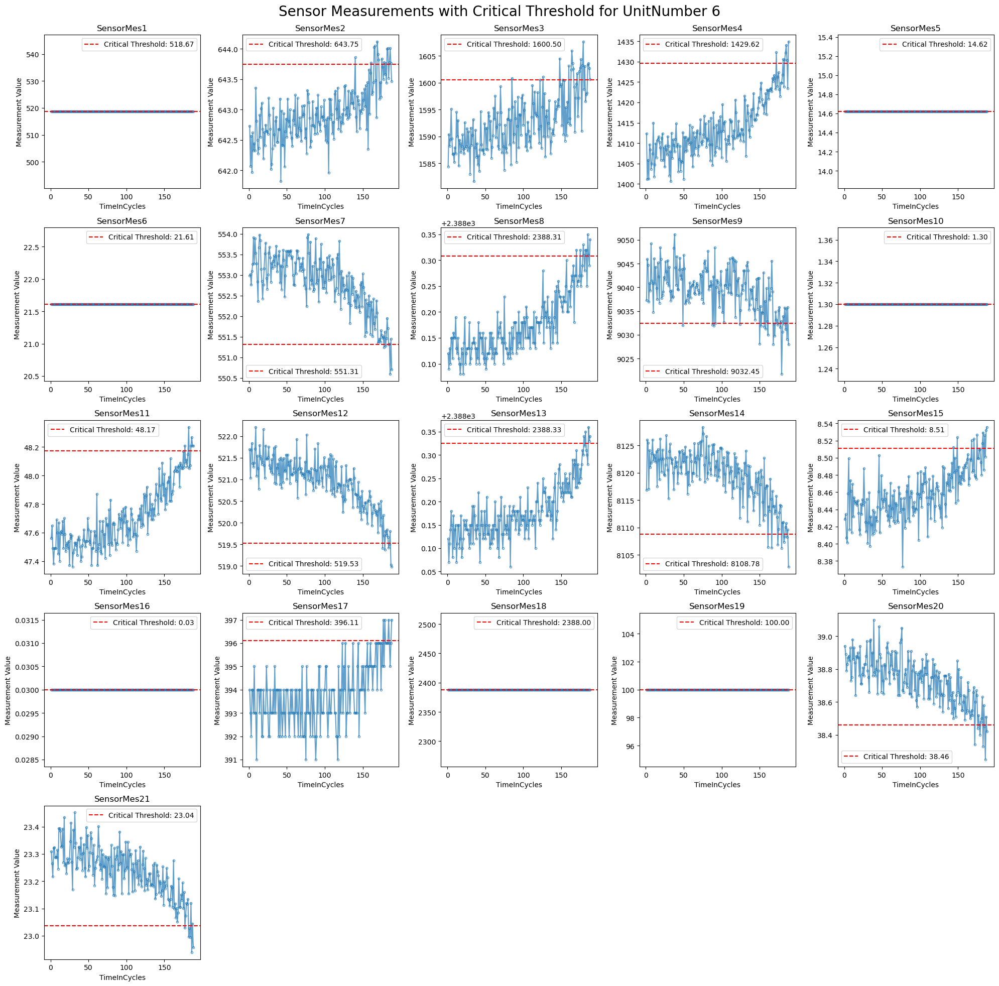

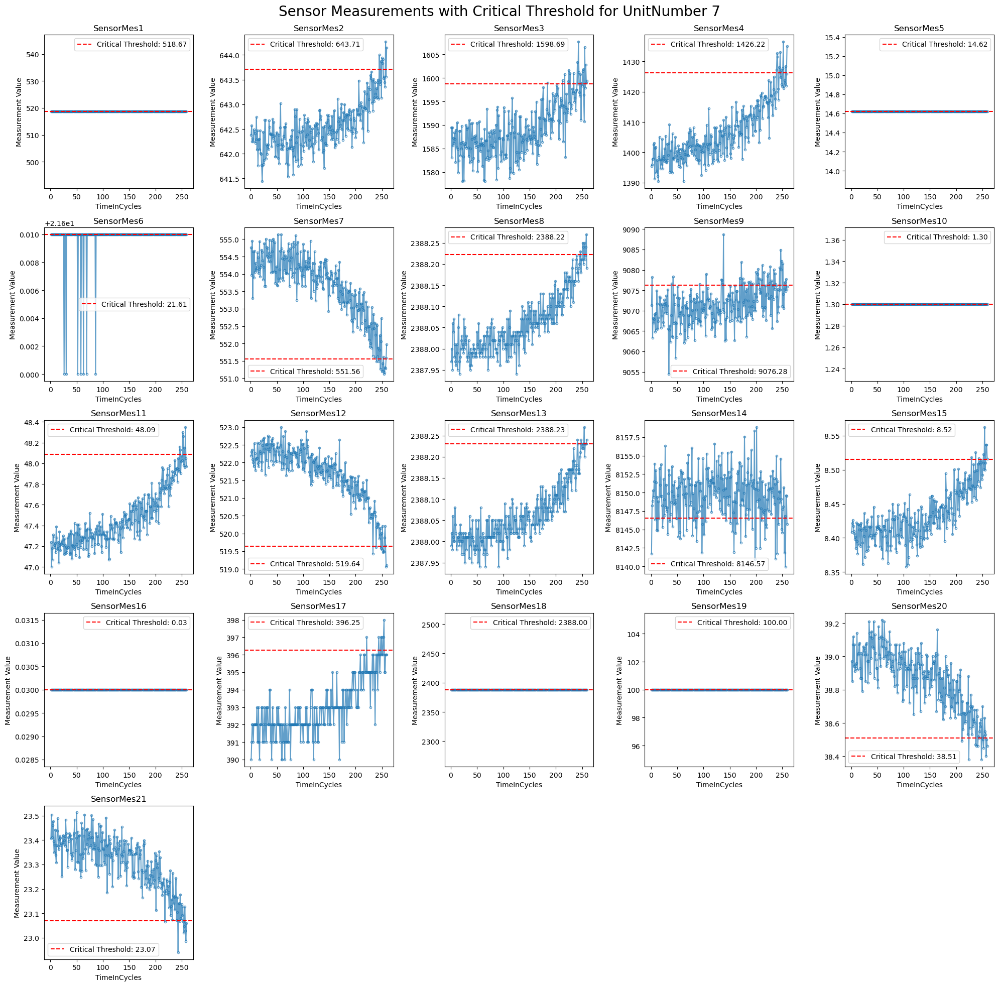

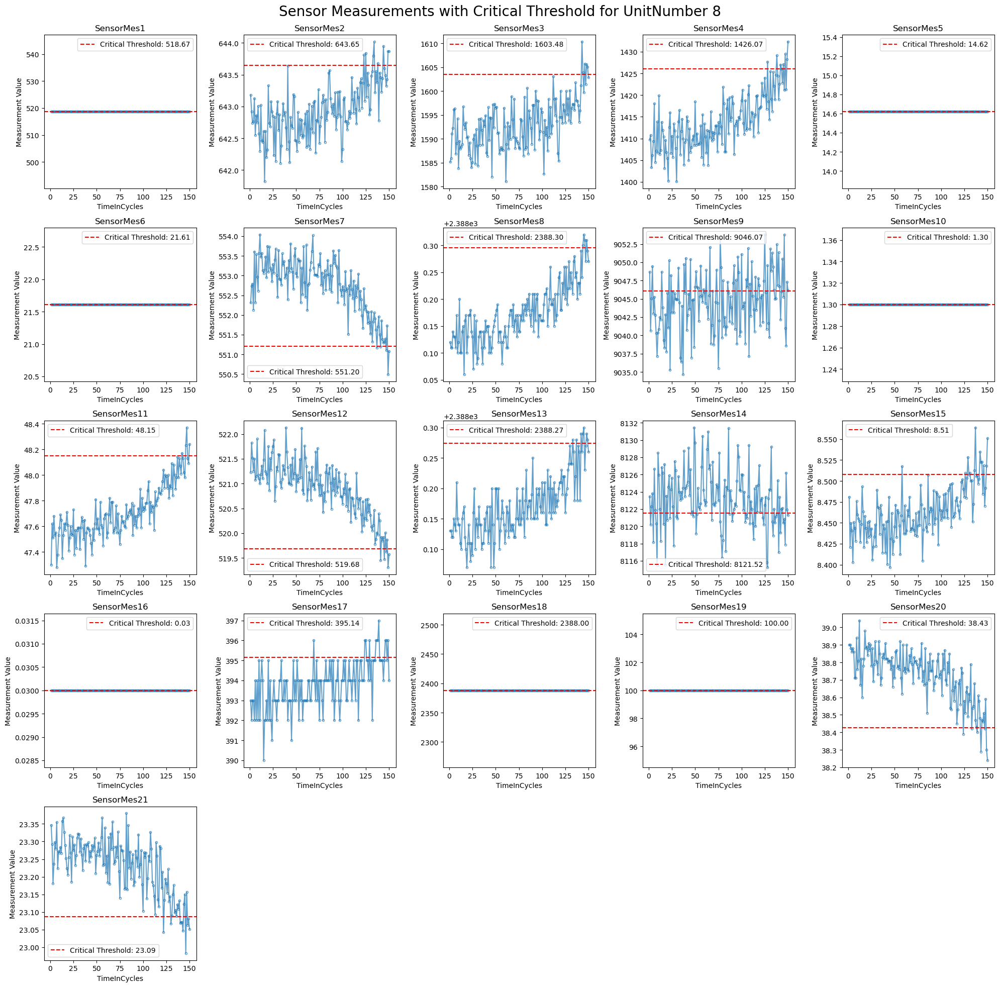

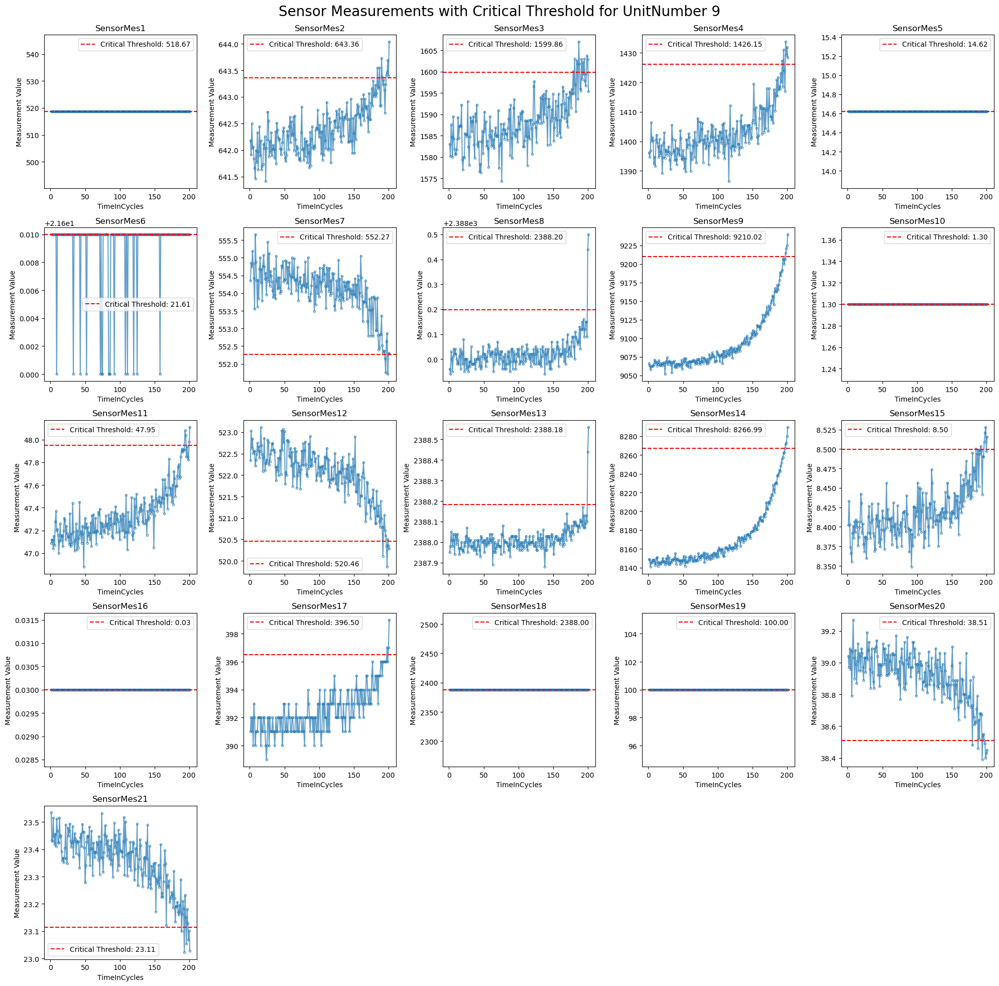

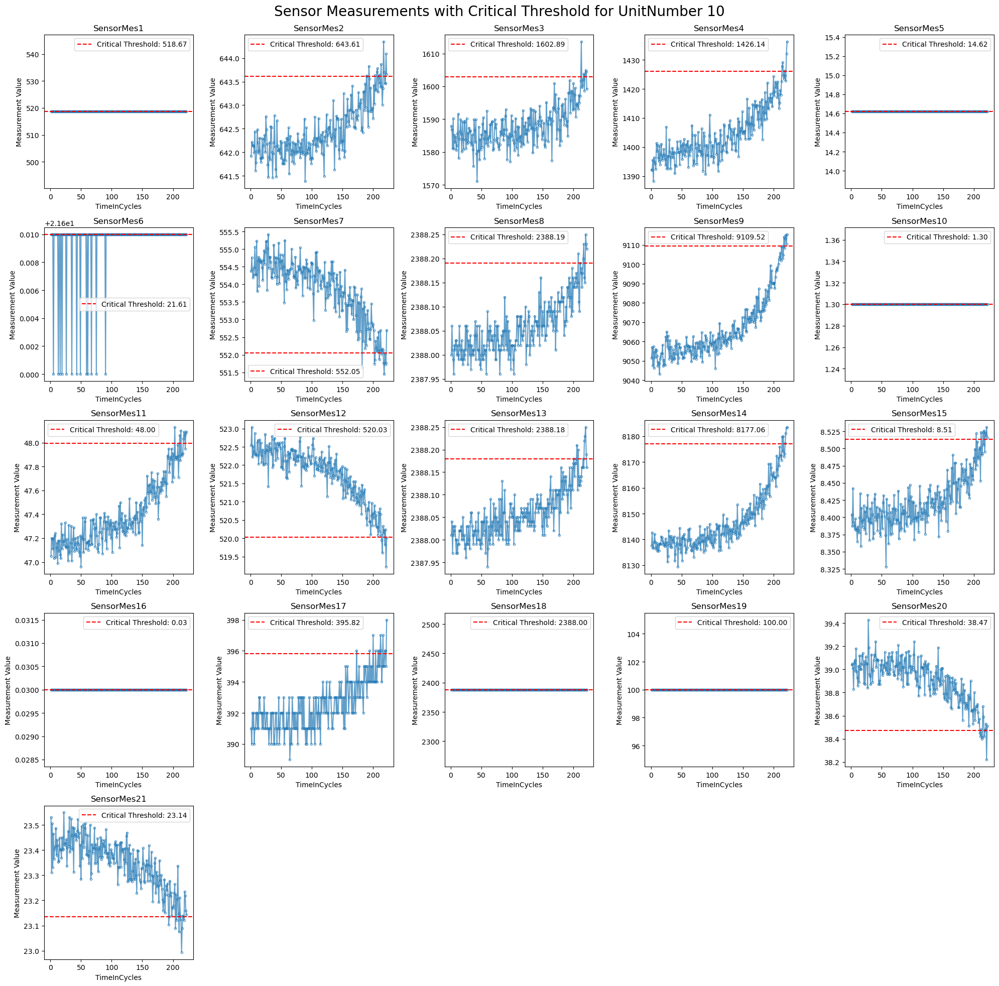

In [40]:
def compute_critical_threshold(data, sensor, fraction=0.05):
    """
    Compute the average of the last fraction of readings as the critical threshold.
    """
    last_cycles = int(len(data) * fraction)
    return data[sensor][-last_cycles:].mean()

# Visualize sensor measurements with critical threshold values for the first 10 units
for unit in data_with_rul[unitNames[0]].unique()[:10]:  # Starting with first 10 units
    data_unit = data_with_rul[data_with_rul[unitNames[0]] == unit]
    
    # Create a new figure for the unit
    fig, axes = plt.subplots(nrows=int(np.ceil(len(sensorMes) / 5)), ncols=5, figsize=(20, 20))
    fig.suptitle(f"Sensor Measurements with Critical Threshold for {unitNames[0]} {unit}", fontsize=20)
    
    # Flatten axes for easy iteration
    axes_flat = axes.flatten()
    
    # Plot sensor measurements and critical threshold with value
    for i, sensor in enumerate(sensorMes):
        ax = axes_flat[i]
        threshold = compute_critical_threshold(data_unit, sensor)
        
        ax.plot(data_unit[timeCycles[0]], data_unit[sensor], marker='.', markerfacecolor='none', alpha=0.7)
        ax.axhline(y=threshold, color='r', linestyle='--', label=f'Critical Threshold: {threshold:.2f}')
        
        ax.set_title(sensor)
        ax.set_xlabel(timeCycles[0])
        ax.set_ylabel('Measurement Value')
        ax.legend()
        
    # Remove any unused subplots
    for i in range(len(sensorMes), len(axes_flat)):
        fig.delaxes(axes_flat[i])
    
    # Adjust layout and display the plot
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()


In [31]:
import random

def selection_aleatoire(df, sample_size, rand_state):
    unique_values = df["UnitNumber"].unique()
    selected_rows = []
    for value in unique_values:
        rows = df[df["UnitNumber"] == value]
        if len(rows) < sample_size : # si la taille de l'echantillon donnée est superieur au nombre total de ligne pour un moteur, reinitialiser la valeur
            sample_size = len(rows)
        random_sample = rows.sample(n=sample_size, random_state = rand_state)  # Sélectionne 50 lignes aléatoires
        selected_rows.append(random_sample)
    result = pd.concat(selected_rows)
    return result
data = selection_aleatoire(df, 10, 0)

,UnitNumber,TimeInCycles,OperSet1,OperSet2,OperSet3,SensorMes1,SensorMes2,SensorMes3,SensorMes4,SensorMes5,SensorMes6,SensorMes7,SensorMes8,SensorMes9,SensorMes10,SensorMes11,SensorMes12,SensorMes13,SensorMes14,SensorMes15,SensorMes16,SensorMes17,SensorMes18,SensorMes19,SensorMes20,SensorMes21
110,1,111,0.0008,0.0004,100.0,518.67,642.67,1584.38,1408.11,14.62,21.61,553.49,2388.12,9051.64,1.3,47.62,521.53,2388.14,8132.40,8.4447,0.03,392,2388,100.0,38.92,23.2135
74,1,75,0.0009,-0.0004,100.0,518.67,641.96,1582.32,1394.82,14.62,21.61,553.60,2388.07,9042.32,1.3,47.22,521.77,2388.11,8130.13,8.4621,0.03,392,2388,100.0,38.89,23.3521
163,1,164,0.0005,-0.0002,100.0,518.67,643.17,1598.96,1416.76,14.62,21.61,551.90,2388.17,9048.92,1.3,47.70,520.63,2388.28,8124.63,8.4803,0.03,394,2388,100.0,38.62,23.1761
97,1,98,0.0006,0.0004,100.0,518.67,642.00,1591.11,1404.56,14.62,21.61,552.75,2388.06,9045.49,1.3,47.37,522.31,2388.06,8127.89,8.4012,0.03,391,2388,100.0,38.96,23.2554
126,1,127,-0.0010,0.0002,100.0,518.67,642.99,1586.90,1399.49,14.62,21.61,553.81,2388.09,9047.90,1.3,47.63,521.34,2388.10,8133.00,8.4626,0.03,393,2388,100.0,38.91,23.2772
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20613,100,183,-0.0011,-0.0002,100.0,518.67,643.34,1594.60,1427.27,14.62,21.61,551.83,2388.20,9066.08,1.3,48.00,520.64,2388.23,8144.21,8.5006,0.03,395,2388,100.0,38.49,23.0709
20436,100,6,-0.0013,-0.0004,100.0,518.67,642.19,1588.84,1403.20,14.62,21.61,553.79,2388.04,9059.83,1.3,47.37,522.02,2388.06,8142.28,8.4120,0.03,392,2388,100.0,38.91,23.5751
20577,100,147,-0.0019,0.0003,100.0,518.67,643.19,1598.86,1419.67,14.62,21.61,553.15,2388.14,9057.93,1.3,47.71,521.16,2388.12,8141.90,8.4466,0.03,393,2388,100.0,38.75,23.1530
20443,100,13,0.0004,-0.0005,100.0,518.67,642.39,1587.66,1397.00,14.62,21.61,553.63,2388.01,9067.10,1.3,47.52,521.62,2388.06,8145.40,8.4317,0.03,392,2388,100.0,39.02,23.3646


# Reccuperer le seuil critique pour chaque capteur de chaque moteur

In [41]:
# Initialize lists to store the data
unit_numbers = []
sensors_list = []
thresholds = []

# Compute thresholds for each unit and sensor
for unit in data_with_rul[unitNames[0]].unique():
    data_unit = data_with_rul[data_with_rul[unitNames[0]] == unit]
    for sensor in sensorMes:
        threshold = compute_critical_threshold(data_unit, sensor)
        unit_numbers.append(unit)
        sensors_list.append(sensor)
        thresholds.append(threshold)

# Create the DataFrame
threshold_df = pd.DataFrame({
    'UnitNumber': unit_numbers,
    'Sensor': sensors_list,
    'Threshold': thresholds
})

threshold_df.shape

(2100, 3)

In [33]:
threshold_df

,UnitNumber,Sensor,Threshold
0,1,SensorMes1,518.670000
1,1,SensorMes2,643.683333
2,1,SensorMes3,1599.744444
3,1,SensorMes4,1426.688889
4,1,SensorMes5,14.620000
...,...,...,...
2095,100,SensorMes17,396.100000
2096,100,SensorMes18,2388.000000
2097,100,SensorMes19,100.000000
2098,100,SensorMes20,38.383000


In [25]:
#threshold_df.iloc[:50,:]

In [26]:
#g_owl2 = Graph()
g_owl2.parse("./cmapss_ontology.owl", format="xml")

<Graph identifier=Nfd4913f2dacb4b32886cf854b9aa907c (<class 'rdflib.graph.Graph'>)>

In [27]:
g_owl2.serialize(destination="./cmapss_ontology_with_data.owl", format="xml")

<Graph identifier=Nfd4913f2dacb4b32886cf854b9aa907c (<class 'rdflib.graph.Graph'>)>

In [30]:
# Mapping the columns
column_mapping = {
    "OperSet1": "MachNumber",
    "OperSet2": "Altitude",
    "OperSet3": "SeaLevelTemperature",
    "TimeInCycles": "Cycle"
}

# Renaming columns based on the mapping
data = data.rename(columns=column_mapping)

# Initializing the RDF graph and namespaces
AERO = Namespace("http://www.aero.org/ontologies/CMAPSS#")
g_owl2_with_data_failure = Graph()
g_owl2_with_data_failure.bind('aero', AERO)
g_owl2_with_data_failure.bind('rdf', RDF)
g_owl2_with_data_failure.bind('rdfs', RDFS)
g_owl2_with_data_failure.bind('owl', OWL)

# Integrating data with unique URIs for each row
for idx, row in data.iterrows():
    # Unique identifier for each row in the dataset
    unit_number = int(row['UnitNumber'])  # Convert to int
    unique_uri = AERO[f"Instance{idx}_Unit{unit_number}"]
    unit_uri = AERO[f"Unit{unit_number}"]  # Directly associate with the ontology's UnitNumber

    # Link the unique instance to its corresponding UnitNumber in the ontology
    g_owl2_with_data_failure.add((unique_uri, AERO.belongsToUnit, unit_uri))

    # Add Cycle
    cycle_value = Literal(int(row['Cycle']), datatype=XSD.int)  # Convert to int
    g_owl2_with_data_failure.add((unique_uri, AERO.hasCycleNumber, cycle_value))

    # Integrate Operating conditions
    oper_conditions_mapping = {
        'MachNumber': 'hasMachNumber',
        'Altitude': 'hasAltitude',
        'SeaLevelTemperature': 'hasSeaLevelTemperature'
    }
    
    for oper_set, condition in oper_conditions_mapping.items():
        condition_value_literal = Literal(row[oper_set], datatype=XSD.float)
        g_owl2_with_data_failure.add((unique_uri, AERO[condition], condition_value_literal))

    # Integrate Sensor values and corresponding failure relations
    for sensor in sensorMes:
        sensor_value = Literal(row[sensor], datatype=XSD.float)
        sensor_uri = AERO[sensor]
        
        # Using a specific property for each sensor value
        g_owl2_with_data_failure.add((unique_uri, AERO[f"hasValueFor{sensor}"], sensor_value))

        # Find the corresponding failure type and add the relation
        failure_type = cmapss_description[cmapss_description["Sensor"] == sensor]["Failure"].values[0]
        failure_uri = AERO[failure_type]
        g_owl2_with_data_failure.add((sensor_uri, AERO.canHave, failure_uri))

# Serialize the updated ontology
output_file_path = "./cmapss_ontology_with_data_failure.owl"
g_owl2_with_data_failure.serialize(destination=output_file_path, format="xml")

<Graph identifier=Nad2da8e3404b4772a0f4e9176c8e7d91 (<class 'rdflib.graph.Graph'>)>

In [31]:
#for subj, pred, obj in g_owl2_with_data_failure:
#    print(subj, pred, obj)
count = 0
for subj, pred, obj in g_owl2_with_data_failure:
    print(subj, pred, obj)
    count += 1
    if count >= 100:
        break

http://www.aero.org/ontologies/CMAPSS#Instance1002_Unit5 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes12 522.19
http://www.aero.org/ontologies/CMAPSS#Instance2143_Unit11 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes15 8.4047
http://www.aero.org/ontologies/CMAPSS#Instance19707_Unit96 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes4 1407.57
http://www.aero.org/ontologies/CMAPSS#Instance2745_Unit14 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes18 2388.0
http://www.aero.org/ontologies/CMAPSS#Instance4920_Unit25 http://www.aero.org/ontologies/CMAPSS#hasSeaLevelTemperature 100.0
http://www.aero.org/ontologies/CMAPSS#Instance13169_Unit67 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes1 518.67
http://www.aero.org/ontologies/CMAPSS#Instance300_Unit2 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes19 100.0
http://www.aero.org/ontologies/CMAPSS#Instance7907_Unit41 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes3 1594

In [ ]:
'''# Loading the ontology
g_owl2_with_data_failure_axioms = Graph()
g_owl2_with_data_failure_axioms.parse(location="./cmapss_ontology_with_data_failure.owl")

# AERO namespace
AERO = Namespace("http://www.aero.org/ontologies/CMAPSS#")

# Iterating through the subset of data to generate RDF triples
for idx, row in data.iterrows():
    unit = row[0]
    for sensor in sensorMes:
        threshold = threshold_df[(threshold_df["UnitNumber"] == unit) & (threshold_df["Sensor"] == sensor)]["Threshold"].values[0]
        axiom = generate_axioms(unit, sensor, row[sensor], threshold)
        
        if axiom is not None:
            # Splitting the axiom string to extract the relevant information
            unit_info, condition_info = axiom.split(", ")

            # Extracting unit number
            unit_number = int(unit_info.split(" ")[2])
            unit_uri = AERO[f"Unit{unit_number}"]

            if "good condition" in condition_info:
                # Adding RDF triple indicating the component is in good condition
                component = condition_info.split(" ")[0]
                g_owl2_with_data_failure_axioms.add((unit_uri, AERO.hasCondition, AERO.GoodCondition))
            else:
                # Adding RDF triple indicating the component has a specific failure
                component, _, failure_type = condition_info.split(" ")
                failure_uri = AERO[failure_type.replace(".", "")]
                g_owl2_with_data_failure_axioms.add((unit_uri, AERO.hasFailure, failure_uri))

# Serialize the updated ontology with axioms for the subset
output_file_path_with_subset_axioms = "./cmapss_ontology_with_data_and_failure_and_subset_axioms.owl"
g_owl2_with_data_failure_axioms.serialize(destination=output_file_path_with_subset_axioms, format="xml")

output_file_path_with_subset_axioms'''



'''# Generate axioms based on the rules provided

def generate_failure_axioms(unit, sensor, value, threshold):
    """ Generate axioms based on sensor values and thresholds. """
    sensor_name = f"SensorMes{sensor}"
    
    trend = cmapss_description.set_index("Sensor")["Trend"].to_dict().get(sensor_name, None)
    component = cmapss_description.set_index("Sensor")["Component"].to_dict().get(sensor_name, None)
    failure_type = cmapss_description.set_index("Sensor")["Failure"].to_dict().get(sensor_name, None)
    
    if trend is None or component is None or failure_type is None:
        return None
    
    failure_uri = None
    if trend in ["up", "~"]:
        if value > threshold:
            failure_uri = AERO[failure_type]
    elif trend == "down":
        if value < threshold:
            failure_uri = AERO[failure_type]

    if failure_uri:
        unit_uri = AERO[f"Instance_Unit{unit}"]
        return (unit_uri, AERO.hasFailure, failure_uri)
    return None

# Regenerate axioms for the data
axioms = []

for index, row in data.iterrows():
    unit = row['UnitNumber']
    for sensor in sensorMes:
        threshold = threshold_df[(threshold_df["UnitNumber"] == unit) & (threshold_df["Sensor"] == sensor)]["Threshold"].values[0]
        axiom = generate_failure_axioms(unit, sensor, row[sensor], threshold)
        if axiom:
            axioms.append(axiom)

# Add axioms to the ontology
for axiom in axioms:
    g_owl2_with_data_failure_axioms.add(axiom)

# Serialize the ontology again
output_file_path_with_axioms = "./cmapss_ontology_with_data_failure_and_axioms2.owl"
g_owl2_with_data_failure_axioms.serialize(destination=output_file_path_with_axioms, format="xml")

output_file_path_with_axioms
'''

# Extracting trends, components, and failure types for each sensor once to optimize performance
sensor_details = cmapss_description.set_index("Sensor")[["Trend", "Component", "Failure"]].to_dict(orient="index")

def optimized_generate_failure_axioms(unit, sensor, value, threshold):
    """ Generate axioms based on sensor values and thresholds using pre-extracted sensor details. """
    
    details = sensor_details.get(sensor)
    if not details:
        return None
    
    trend, component, failure_type = details["Trend"], details["Component"], details["Failure"]
    
    axiom = f"For Unit {unit}, "
    
    if trend in ["up", "~"]:
        if value <= threshold:
            axiom += f"{component} is in good condition."
        else:
            axiom += f"{component} has a {failure_type}."
    elif trend == "down":
        if value >= threshold:
            axiom += f"{component} is in good condition."
        else:
            axiom += f"{component} has a {failure_type}."
    
    return axiom

# Regenerate the axioms using the optimized function
axioms = []
for index, row in data.iterrows():
    unit = row['UnitNumber']
    for sensor in sensorMes:
        threshold = threshold_df[(threshold_df["UnitNumber"] == unit) & (threshold_df["Sensor"] == sensor)]["Threshold"].values[0]
        axiom = optimized_generate_failure_axioms(unit, sensor, row[sensor], threshold)
        if axiom:
            axioms.append(axiom)

# Add axioms to the ontology
for axiom in axioms:
    g_owl2_with_data_failure_axioms.add(axiom)


# Serialize the ontology again
output_file_path_with_axioms = "./cmapss_ontology_with_data_failure_and_axioms2.owl"
g_owl2_with_data_failure_axioms.serialize(destination=output_file_path_with_axioms, format="xml")

output_file_path_with_axioms

In [61]:
count = 0
for subj, pred, obj in g_owl2_with_data_failure_axioms:
    print(subj, pred, obj)
    count += 1
    if count >= 100:
        break

http://www.aero.org/ontologies/CMAPSS#Instance1002_Unit5 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes12 522.19
http://www.aero.org/ontologies/CMAPSS#Instance2143_Unit11 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes15 8.4047
http://www.aero.org/ontologies/CMAPSS#Instance19707_Unit96 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes4 1407.57
http://www.aero.org/ontologies/CMAPSS#Instance2745_Unit14 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes18 2388.0
http://www.aero.org/ontologies/CMAPSS#Instance4920_Unit25 http://www.aero.org/ontologies/CMAPSS#hasSeaLevelTemperature 100.0
http://www.aero.org/ontologies/CMAPSS#Instance13169_Unit67 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes1 518.67
http://www.aero.org/ontologies/CMAPSS#Instance300_Unit2 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes19 100.0
http://www.aero.org/ontologies/CMAPSS#Instance7907_Unit41 http://www.aero.org/ontologies/CMAPSS#hasValueForSensorMes3 1594

In [73]:
'''from owlready2 import get_ontology, default_world
from owlready2 import sync_reasoner

# Load the ontology
onto = get_ontology("./cmapss_ontology_with_data_failure_and_axioms2.owl").load()

# Run the default reasoner
sync_reasoner()'''

from owlready2 import get_ontology, default_world
from owlready2 import sync_reasoner_pellet

# Load your ontology
onto = get_ontology("./cmapss_ontology_with_data_failure_and_axioms2.owl").load()

# Use the Pellet reasoner
sync_reasoner_pellet()


* Owlready2 * Running Pellet...
    java -Xmx2000M -cp C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\antlr-3.2.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\antlr-runtime-3.2.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\aterm-java-1.6.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\commons-codec-1.6.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\httpclient-4.2.3.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\httpcore-4.2.2.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\jcl-over-slf4j-1.6.4.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\jena-arq-2.10.0.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\jena-core-2.10.0.jar;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\pellet\jena-iri-0.9

OwlReadyJavaError: Java error message is:
Error occurred during initialization of VM
Could not reserve enough space for 2048000KB object heap


In [70]:
import owlready2
print(owlready2.__path__)


['C:\\Users\\ibarry\\AppData\\Local\\anaconda3\\lib\\site-packages\\owlready2']


In [55]:
from owlready2 import get_ontology, default_world

# Load the ontology using Owlready2
onto = get_ontology(output_file_path_with_subset_axioms).load()

# Using the integrated reasoner (HermiT) to classify the ontology
with onto:
    sync_reasoner()  # This will perform reasoning

# Sample SPARQL query using Owlready2: Retrieve all units that have a failure
query_string = """
    PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
    SELECT ?unit
    WHERE {
        ?unit aero:hasFailure ?failure .
    }
    LIMIT 10
"""

results = list(default_world.sparql(query_string))

# Extracting the results
units_with_failures_owlready = [str(result[0]) for result in results]

units_with_failures_owlready

* Owlready2 * Running HermiT...
    java -Xmx2000M -cp C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\hermit;C:\Users\ibarry\AppData\Local\anaconda3\lib\site-packages\owlready2\hermit\HermiT.jar org.semanticweb.HermiT.cli.CommandLine -c -O -D -I file:///C:/Users/ibarry/AppData/Local/Temp/tmpebnkd8zc


OwlReadyJavaError: Java error message is:
Error occurred during initialization of VM
Could not reserve enough space for 2048000KB object heap


In [ ]:
# Preparing the SPARQL queries
queries = {
    "components_with_failures": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT DISTINCT ?component
        WHERE {
            ?sensor aero:monitors ?component .
            ?unit aero:hasFailure ?failure .
            ?sensor aero:canHave ?failure .
        }
    """,
    
    "top_10_sensors": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT ?sensor (COUNT(?failure) AS ?failureCount)
        WHERE {
            ?sensor aero:canHave ?failure .
            ?unit aero:hasFailure ?failure .
        }
        GROUP BY ?sensor
        ORDER BY DESC(?failureCount)
        LIMIT 10
    """,
    
    "units_in_good_condition": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT ?unit
        WHERE {
            ?unit aero:hasCondition aero:GoodCondition .
        }
    """,
    
    "failures_detected_by_many_sensors": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT ?failure (COUNT(?sensor) AS ?sensorCount)
        WHERE {
            ?sensor aero:canHave ?failure .
        }
        GROUP BY ?failure
        HAVING (?sensorCount > 5)
    """,
    
    "units_with_overheating": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT ?unit ?cycle
        WHERE {
            ?unit aero:hasCycleNumber ?cycle .
            ?unit aero:hasFailure aero:Overheating .
        }
        ORDER BY ?unit ?cycle
    """
}

# Executing the queries and storing the results
query_results = {}
for query_name, query_string in queries.items():
    results = list(g_owl2_with_data_failure_axioms.query(query_string))
    query_results[query_name] = results

query_results


In [ ]:
# Basic validation queries to check the structure and data in the ontology

validation_queries = {
    "all_units": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT ?unit
        WHERE {
            ?unit aero:belongsToUnit ?unitNumber .
        }
        LIMIT 10
    """,
    
    "all_sensors": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT ?sensor
        WHERE {
            ?sensor aero:canHave ?failure .
        }
        LIMIT 10
    """,
    
    "all_failures": """
        PREFIX aero: <http://www.aero.org/ontologies/CMAPSS#>
        SELECT ?unit ?failure
        WHERE {
            ?unit aero:hasFailure ?failure .
        }
        LIMIT 10
    """
}

# Executing the validation queries
validation_results = {}
for query_name, query_string in validation_queries.items():
    results = list(g_owl2_with_data_failure_axioms.query(query_string))
    validation_results[query_name] = results

validation_results
